<a href="https://colab.research.google.com/github/limonheiro/Pix2PixGenerator/blob/main/Pix2Pix_2v.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from __future__ import print_function, division

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from keras.datasets import mnist
#from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import tensorflow as tf
import matplotlib.pyplot as plt
import sys
import numpy as np

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

from google.colab import drive
drive.mount('/content/drive')

print("Tensorflow version " + tf.__version__)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Tensorflow version 2.5.0


In [2]:
trainA = np.load(f'drive/MyDrive/fotos/gaze_eye_face_incorrect.npy')
trainB = np.load(f'drive/MyDrive/fotos/gaze_eye_face_correct.npy')

trainA = trainA.astype('float32')
trainB = trainB.astype('float32')

trainA = (trainA/127.5) - 1.
trainB = (trainB/127.5) - 1.

In [3]:
size_t = len(trainA)
train_size = int(size_t * 0.8)
test_size = int(size_t * 0.2)

dataset = tf.data.Dataset.from_tensor_slices((trainA, trainB))
train_dataset = dataset.take(train_size)
test_dataset = dataset.skip(test_size)

train_dataset = train_dataset.batch(32)

test_dataset = test_dataset.batch(32)

##Variaveis do sistema

In [4]:
#Input shape
img_rows = 256
img_cols = 256
channels = 3
img_shape = (img_rows, 
                  img_cols, 
                  channels)

gf = 64
df = 64

In [5]:
#U-net Generator
# define an encoder block
def conv2d(layer_in,n_filters,f_size=4,batchnorm=True,strides=2):
  # add downsampling layer
  g = Conv2D(n_filters, 
              kernel_size=f_size, 
              strides=strides, 
              padding='same')(layer_in)
  # conditionally add batch normalization
  if batchnorm:
    g = BatchNormalization(momentum=0.8)(g, training=False)
  # leaky relu activation
  g = LeakyReLU(alpha=0.2)(g)
  return g 

# define an dencoder block
def deconv2d(layer_in,skip_in,n_filters,f_size=4,dropout=False):

  # add upsampling layer
  g= UpSampling2D(size=2)(layer_in)

  g = Conv2D(n_filters, 
            kernel_size=f_size, 
            strides=1, 
            padding='same', 
            activation='relu')(g)
  # conditionally add dropout
  if dropout:
    g = Dropout(0.5)(g)
  # add batch normalization
  g = BatchNormalization(momentum=0.8)(g)
  # merge with skip connection
  g = Concatenate()([g, skip_in])
  return g

In [6]:
def build_generator():

  # define an E-Net block
  # image input
  in_image = Input(shape=img_shape)

  # encoder model
  e1 = conv2d(in_image, gf,batchnorm=False)
  # e1_3 = conv2d(in_image, n_filters=gf,f_size=3,batchnorm=False)
  e2 = conv2d(e1, gf*2)
  e3 = conv2d(e2, gf*4)
  e4 = conv2d(e3, gf*8)
  e5 = conv2d(e4, gf*8)
  e6 = conv2d(e5, gf*8)
  e7 = conv2d(e6, gf*8)

  # decoder model
  d1 = deconv2d(e7, e6, gf*8)
  d2 = deconv2d(d1, e5, gf*8)
  d3 = deconv2d(d2, e4, gf*8)
  d4 = deconv2d(d3, e3, gf*4)
  d5 = deconv2d(d4, e2, gf*2)
  d6 = deconv2d(d5, e1, 64)

  d7 = UpSampling2D(size=2)(d6)
  output_img = Conv2D(channels, 
                    kernel_size=4,
                    strides=1,
                    padding='same',
                    activation='tanh')(d7)

  return Model(inputs=in_image, outputs=output_img)

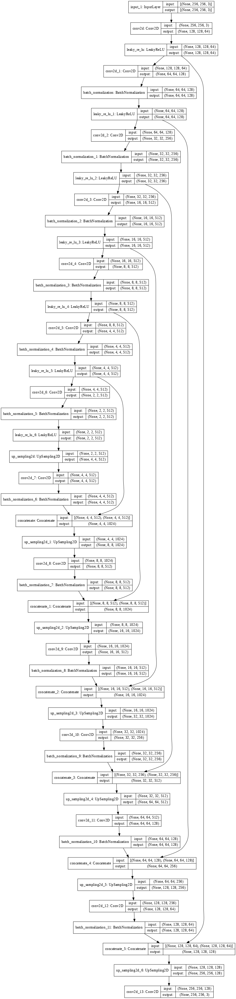

In [7]:
generator = build_generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [8]:
!ls drive/MyDrive/fotos/Columbia\ Gaze\ Data\ Set/0001/0001_2m_0P_0V_-10H.jpg

'drive/MyDrive/fotos/Columbia Gaze Data Set/0001/0001_2m_0P_0V_-10H.jpg'


In [9]:
image = tf.io.read_file('drive/MyDrive/fotos/Columbia Gaze Data Set/0001/0001_2m_0P_0V_-10H.jpg')
inp = tf.image.decode_image(image)
inp = tf.image.resize(inp, [256,256])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


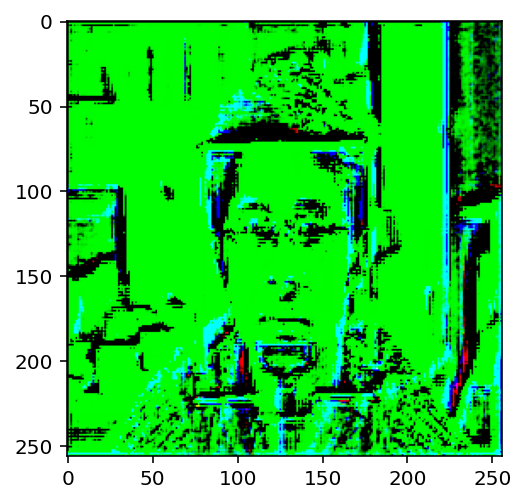

In [10]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [11]:
#https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb#scrollTo=Q1Xbz5OaLj5C
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [12]:
def build_discriminator():
  def d_layer(layer_input, filters, f_size=4, bn=True):
    """Discriminator layer"""
    d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
    d = LeakyReLU(alpha=0.2)(d)
    if bn:
      d = BatchNormalization(momentum=0.8)(d)
    return d
    
  img_A = Input(shape=img_shape, name='input_image')
  img_B = Input(shape=img_shape, name='target_image')

  # Concatenate image and conditioning image by channels to produce input
  combined_imgs = Concatenate(axis=-1)([img_A, img_B])

  # d1 = d_layer(combined_imgs, df, bn=False)
  # # define an E-Net block
  # # image input
  # in_image = Input(shape=img_shape)

  # encoder model
  e1 = conv2d(combined_imgs, gf,batchnorm=False)
  # e1_3 = conv2d(in_image, n_filters=gf,f_size=3,batchnorm=False)
  e2 = conv2d(e1, gf*2)
  e3 = conv2d(e2, gf*4)
  e4 = conv2d(e3, gf*8)
  e5 = conv2d(e4, gf*8)
  e6 = conv2d(e5, gf*8)
  e7 = conv2d(e6, gf*8)

  # decoder model
  d1 = deconv2d(e7, e6, gf*8)
  d2 = deconv2d(d1, e5, gf*8)
  d3 = deconv2d(d2, e4, gf*8)
  d4 = deconv2d(d3, e3, gf*4)
  d5 = deconv2d(d4, e2, gf*2)
  d6 = deconv2d(d5, e1, 64)

  b = BatchNormalization()(d6)
  le = LeakyReLU(0.2)(b)
  zero = ZeroPadding2D()(le)

  validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(zero)

  return Model(inputs=[img_A, img_B], outputs=validity)

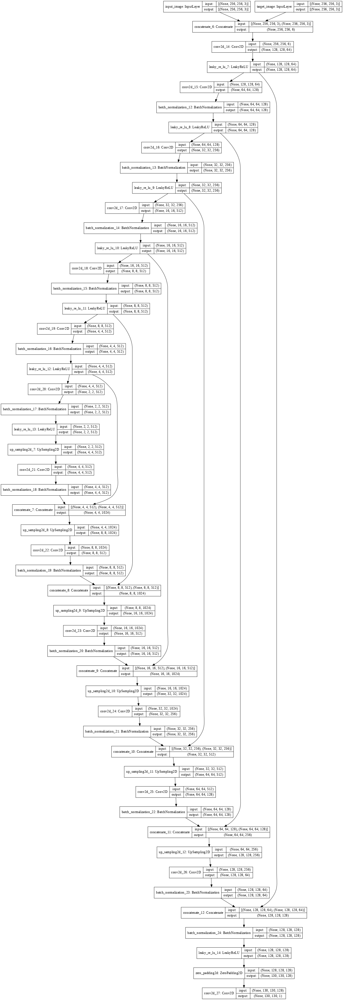

In [13]:
discriminator = build_discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

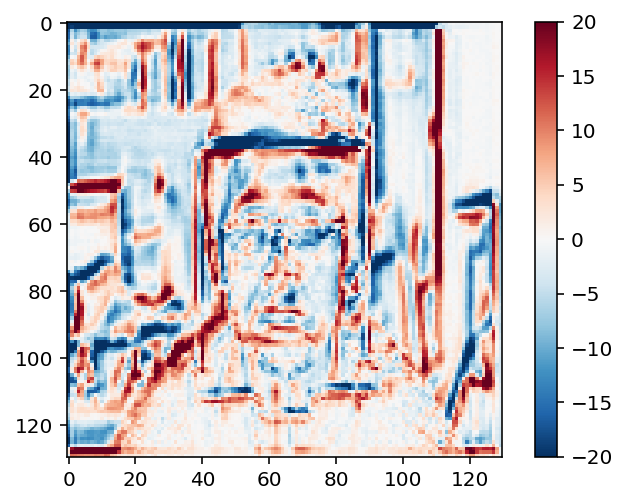

In [14]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [15]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

##CheckPoints

In [16]:
generator_optimizer = Adam(2e-4, beta_1=0.5)
discriminator_optimizer = Adam(2e-4, beta_1=0.5)

In [17]:
checkpoint_dir = 'drive/MyDrive/fotos/pix2pix_2v/'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

##Test Imagens

In [18]:
def sample_images(model, epoch, epochs, Input, Target):
  prediction = model(Input, training=True)
  os.makedirs('images/%s' % 'gaze_eye_face', exist_ok=True)
  plt.figure(figsize=(15, 15))

  r, c = 1, 4

  inputI = Input[0] 
  target = Target[0] 
  pred = prediction[0] 
  sub = target-pred
  
  gen_imgs = [Input[0] , Target[0], prediction[0], sub]
  titles = ['Input', 'Target', 'Generated', 'Traget-Generated']
  for j in range(c):
    plt.subplot(1, c, j+1)
    plt.title(titles[j])
    plt.axis('off')
    plt.imshow(gen_imgs[j][:,:,::-1] * 0.5 + 0.5)
    plt.savefig("drive/MyDrive/fotos/pix2pix_2v/%d_%d.png" % (int(epoch+1), int(epochs)))
  plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


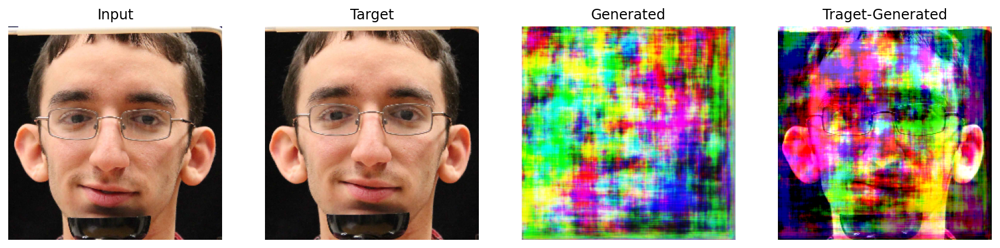

In [19]:
for example_input, example_target in test_dataset.take(1):
  sample_images(model=generator, epoch=-1, epochs=200,Input=example_input, Target=example_target)

In [20]:
log_dir="drive/MyDrive/fotos/pix2pix_2v/logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [21]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [25]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start_time = datetime.datetime.now() 
  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      start = datetime.datetime.now()
      display.clear_output(wait=True)

      elapsed_time = datetime.datetime.now() - start_time

      if step != 0:
        print(f'Time taken for 1000 steps: {elapsed_time} sec\n')
      else:
        print(f'Time taken for 1000 steps: {start - elapsed_time} sec\n')

      sample_images(model=generator,epoch=step, epochs=steps, Input=example_input, Target=example_target)
      print(f"Step: {step//1000}k")
      print(f'elapsed_time Time: {elapsed_time}')

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print(f'.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

In [23]:
#docs_infra: no_execute
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Time taken for 1000 steps: 9:54:26.941920 sec



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


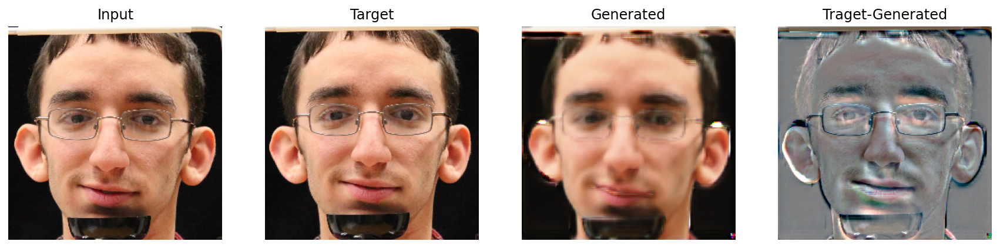

Step: 21k
elapsed_time Time: 9:54:26.941920
............................

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")